# DSCI 100 Group 10 Project Proposal: Austin, TX Housing Prices
#### Bhagat Basra, Oscar Cheng, Lucas Wei, Wanning Zhang
### Introduction
Housing prices are dependent on a multitude of variables. We will be investigating the housing market in Austin, Texas, the tenth-most populous city in the United States and the price of single-family homes in this area (Moskowitz, 2024). Prices of homes are influenced by a variety of factors including the size, the number of bedrooms, the quality of the nearby school, and its age. We chose to investigate these variables because we observed a relationship between them and the house price. 

The question we will try to answer with our project is, **"Can we predict the housing prices of single-family homes in Austin, Texas based on the living area square footage, number of bedrooms, average school rating, and year it was built?”**
The dataset we will be using is called “Austin, TX House Listings”. This dataset contains house listing data from 2021. 

### Preliminary exploratory data analysis:
Here we are reading in our dataset

In [ ]:
library(tidyverse)
library(repr)
library(tidymodels)
library(RCurl)
options(repr.matrix.max.rows = 6)

In [2]:
url <- getURL("https://raw.githubusercontent.com/Victorier0101/dsci_project/main/austinHousingData.csv")
data <- read_csv(url)
data

Rows: 15171 Columns: 47
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr   (6): city, streetAddress, description, homeType, latestPriceSource, ho...
dbl  (34): zpid, zipcode, latitude, longitude, propertyTaxRate, garageSpaces...
lgl   (6): hasAssociation, hasCooling, hasGarage, hasHeating, hasSpa, hasView
date  (1): latest_saledate

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


zpid,city,streetAddress,zipcode,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,⋯,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeImage
<dbl>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
111373431,pflugerville,14424 Lake Victor Dr,78660,"14424 Lake Victor Dr, Pflugerville, TX 78660 is a single family home that contains 2,601 sq ft and was built in 2012. It contains 4 bedrooms and 3 bathrooms. The Zestimate for this house is $344,417. The Rent Zestimate for this home is $2,195/mo.",30.43063,-97.66308,1.98,2,TRUE,⋯,1,1,1.266667,2.666667,1063,14,3,4,2,111373431_ffce26843283d3365c11d81b8e6bdc6f-p_f.jpg
120900430,pflugerville,1104 Strickling Dr,78660,"Absolutely GORGEOUS 4 Bedroom home with 2 full baths located in the tucked away Pflugerville community The Lakes at Northtown. This home was recently updated with new carpets, new tile kitchen back splash, and fresh paint throughout the entire house. This charming abode is a MUST SEE if you're looking for an affordable home in the Austin area. Something very hard to come by in this market! Only 14 miles from downtown, this home will accommodate downtown commuting as well as a work from home environment. This community is tucked away and yet only minutes from major retailers and shopping. Do not miss this opportunity!",30.43267,-97.66170,1.98,2,TRUE,⋯,1,1,1.400000,2.666667,1063,14,2,4,1,120900430_8255c127be8dcf0a1a18b7563d987088-p_f.jpg
2084491383,pflugerville,1408 Fort Dessau Rd,78660,"Under construction - estimated completion in August 2019. The Pioneer features an expansive open floorplan, 3 spacious bedrooms, 2 bathrooms, and a stunning kitchen. Upon entering the Pioneer, you will pass through the impressive entry way. Keep walking, and you will pass the two private secondary bedrooms which both have large walk-in closets. The entryway leads you into the huge open family room and kitchen area with a huge island with granite counters. Next to the kitchen is the dining room, conveniently separated from the main living area of the family room. A large covered patio greets you as you walk out the back door into the backyard. A private and spacious master suite is the cherry on top of this home and will provide a quiet place for you to relax after a long day. This home is very close to the fantastic amenity center. All of this in just 1472 sqft is a deal that you will find very hard to beat!",30.40975,-97.63977,1.98,0,TRUE,⋯,1,1,1.200000,3.000000,1108,14,2,3,1,2084491383_a2ad649e1a7a098111dcea084a11c855-p_f.jpg
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋱,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
29473281,austin,2206 S 3rd St,78704,"Original bungalow with a modern addition. Large corner windows. Separate cottage in the back with its own yard. 2 car garage/shed in the middle. Large fenced yard, barbecue area, mature oak trees. SELLING AS-IS WITH THE PROPERTY NEXT DOOR AT 2204 SOUTH 3RD ST.",30.24483,-97.76112,1.98,2,FALSE,⋯,1,1,0.8,5.000000,889,13,3,3,2,29473281_9e90ec4652c4b3b6592a7fdd09f1ea6d-p_f.jpg
29392029,austin,2000 Chestnut Ave,78722,"So many options at this address in the eclectic Blackland Neighborhood! Live on one side and rent the other, rent both, mix in a little short-term rental or tear down and build one, maybe two new units! This corner lot can support all of your Eastside real estate goals. Originally founded by Swedish immigrants, this area is rich in history & culture. It's a very walkable and bikeable location with downtown, Dell Medical School and UT Austin just minutes away. Walk to top restaurants, bars & entertainment. 2BR/1B on each side. Current rent for Unit B is $1,500/mo.",30.28157,-97.71779,1.98,0,FALSE,⋯,1,1,1.3,6.666667,1057,15,2,4,1,29392029_a9a8306ea363d23f37d91d37975a1b96-p_f.jpg
29390174,austin,3110 E 12th St,78702,"3110 E 12th St, Austin, TX 78702 is a single family home that contains 720 sq f

Below we are processing the data for our selected variables and filtering for single-family homes. We also filter specifically for Austin, Texas as ~1% of the homes in the dataset are from the Greater Austin area. We then split the data into training and testing.

In [3]:
data_selected <- data |> 
    filter(homeType == "Single Family", city == "austin") |> 
    select(latestPrice, homeType, livingAreaSqFt, numOfBedrooms, avgSchoolRating, yearBuilt)

In [4]:
data_split <- initial_split(data_selected, prop = 0.75, strata = latestPrice) 
data_training <- training(data_split)
data_testing <- testing(data_split)
data_training

latestPrice,homeType,livingAreaSqFt,numOfBedrooms,avgSchoolRating,yearBuilt
<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
199000,Single Family,1511,3,2.666667,2006
240000,Single Family,1534,3,3.000000,1999
249900,Single Family,1738,3,3.000000,2013
⋮,⋮,⋮,⋮,⋮,⋮
647877,Single Family,2234,5,7.000000,2004
1499000,Single Family,3877,6,5.666667,2020
875000,Single Family,1524,3,5.000000,1936


Below we are performing exploratory data analysis and summarizing the data in a table. We are showing the total number of homes in our training data aswell as the mean of all our selected predictors.

In [5]:
data_summary <- summarize(data_training,
                    total_homes = n(),
                    mean_price = mean(latestPrice),
                    mean_sqft = mean(livingAreaSqFt),
                    mean_bedrooms = mean(numOfBedrooms),
                    mean_school_rating = mean(avgSchoolRating),
                    mean_year_built = mean(yearBuilt))
data_summary 

total_homes,mean_price,mean_sqft,mean_bedrooms,mean_school_rating,mean_year_built
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
10571,520634.5,2223.811,3.479425,5.829259,1988.29


Here are plots comparing each selected predictor with housing price. Outliers in the training data were ommited in the visualization to better represent the relationship. 

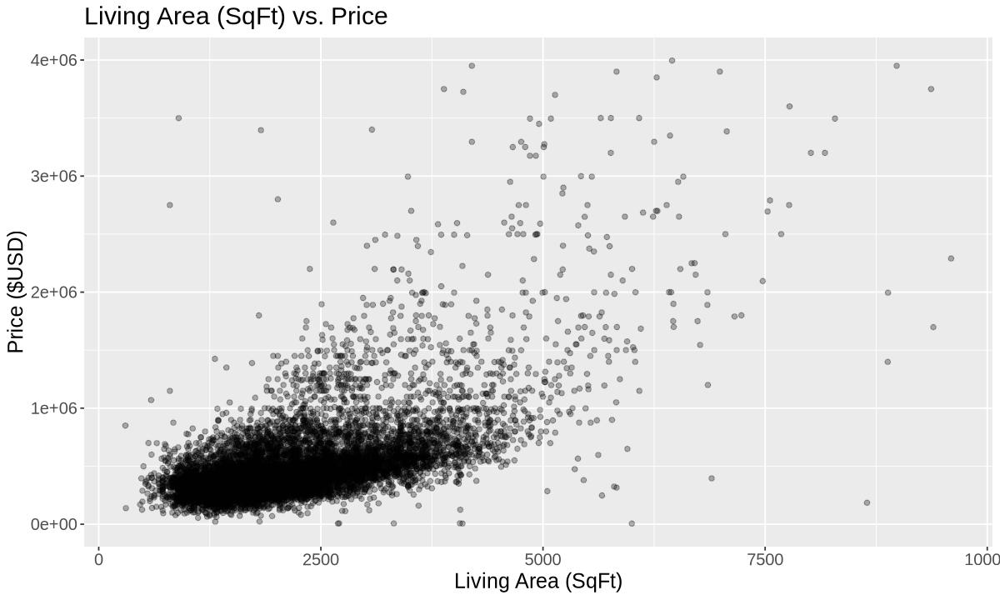

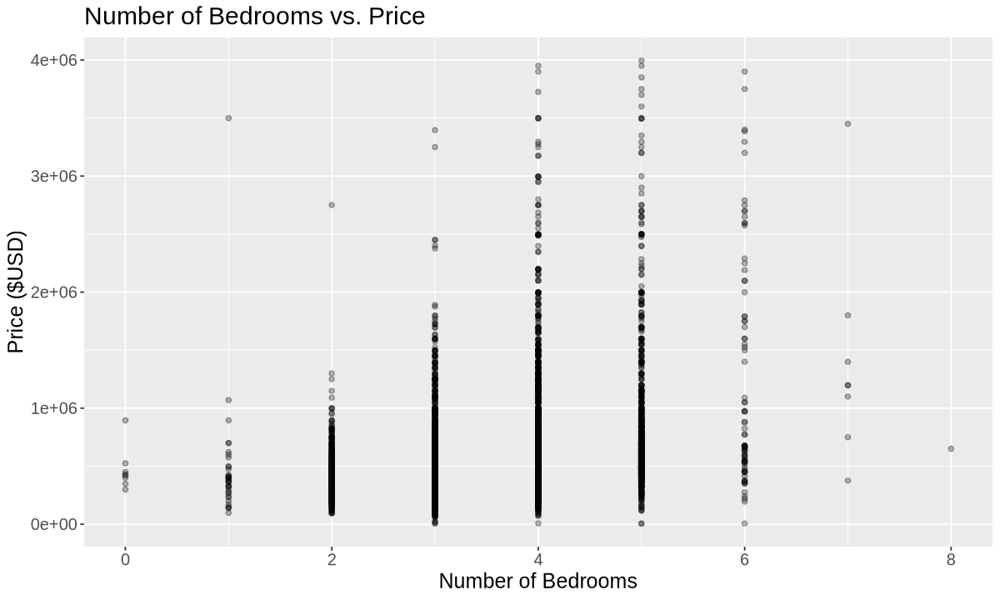

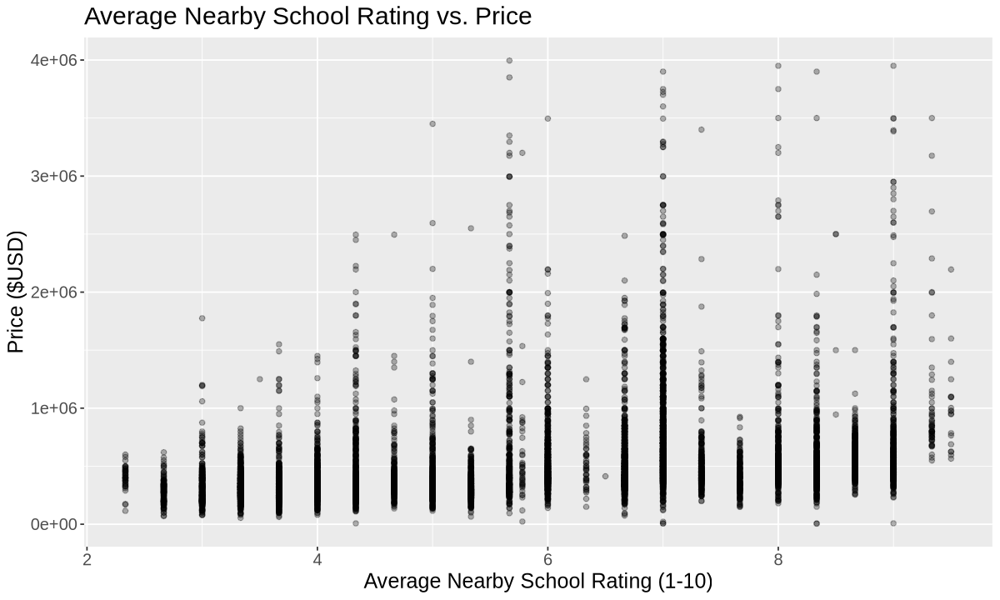

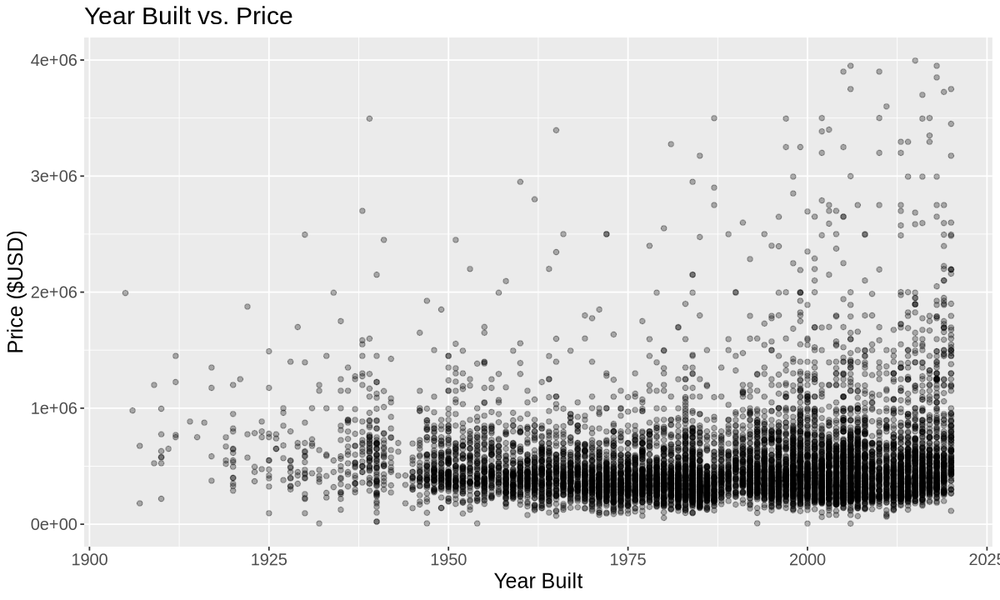

In [12]:
data_sqft_plot <- data_training |>
    filter(livingAreaSqFt < 10000, latestPrice < 4000000)|>
    ggplot(aes(x= livingAreaSqFt, y= latestPrice))+
                geom_point(alpha = 0.3)+
                labs(x="Living Area (SqFt)", y="Price ($USD)")+
                ggtitle("Living Area (SqFt) vs. Price")+
                theme(text = element_text(size = 15))
                options(repr.plot.width = 10, repr.plot.height = 6)
data_sqft_plot

data_bedrooms_plot <- data_training |>
    filter(latestPrice < 4000000)|>
    ggplot(aes(x= numOfBedrooms, y= latestPrice))+
                geom_point(alpha = 0.3)+
                labs(x="Number of Bedrooms", y="Price ($USD)")+
                ggtitle("Number of Bedrooms vs. Price")+
                theme(text = element_text(size = 15))
                options(repr.plot.width = 10, repr.plot.height = 6)
data_bedrooms_plot

data_school_plot <- data_training |>
    filter(latestPrice < 4000000)|>
    ggplot(aes(x= avgSchoolRating, y= latestPrice))+
                geom_point(alpha = 0.3)+
                labs(x="Average Nearby School Rating (1-10)", y="Price ($USD)")+
                ggtitle("Average Nearby School Rating vs. Price")+
                theme(text = element_text(size = 15))
                options(repr.plot.width = 10, repr.plot.height = 6)
data_school_plot

data_yearbuilt_plot <- data_training |>
    filter(latestPrice < 4000000)|>
    ggplot(aes(x= yearBuilt, y= latestPrice))+
                geom_point(alpha = 0.3)+
                labs(x="Year Built", y="Price ($USD)")+
                ggtitle("Year Built vs. Price")+
                theme(text = element_text(size = 15))
                options(repr.plot.width = 10, repr.plot.height = 6)
data_yearbuilt_plot

These graphs demonstrate why we selected these predictors. In each visualization, there is a relationship for each predictor which is linear and relatively weak. Since these graphs show some form of correlation, this indicates that they will be a good predictor in our model and provide valuable information because the price seeems to be dependent on them.

### Methods:
To investigate our question, we will use a regression model. We will split our data set into a training and testing set and use K-nearest neighbours regression to build a model, then train the model, and then evaluate the model based on the testing data.

We will conduct our data analysis using the following columns: homeType, latestPrice, livingAreaSqFt, numOfBedrooms, avgSchoolRating, yearBuilt. We will first filter out all the home types that are not single-family, then the model will be based on predictors of living area in square feet, the number of bedrooms, average school rating near the area, and the year built. Our model will predict the price of the single-family house given these variables.

One way we will visualize the results is using a confusion matrix in order to determine the precision of our prediction and also ggplots of each variable compared to the predicted and actual housing price by overlaying a prediction line.
### Expected outcomes and significance:
We expect to find that the model will be accurate in predicting the price of houses in Austin, Texas. 

Creating an accurate model of housing prices given certain input variables can have great impact. This would allow home owners to predict the price of their house to ensure that they were asking for a fair value. Another possible impact of this model is that it would allow real estate investors to use the model to identify undervalued property, increasing potential returns. Another way this model could be used is by banks and other mortgage lenders to appropriately asses the risk of a loan. 

Some future questions and investigations that could be explored is if using more variables will create a more accurate model. It could also be investigated which variables effect home price the most. Furthermore, more than just single family homes could be studied such as apartments, townhomes, or condos and in cities other than Austin, Texas.

### Work Cited
Moskowitz, D. (2024, January 23). *10 largest cities in the U.S.* Investopedia. https://www.investopedia.com/articles/personal-finance/050815/top-10-most-developed-cities-us.asp 

Data set obtained from: Pierce, E. (2021, April 12). *Austin, TX House listings*. Kaggle. https://www.kaggle.com/datasets/ericpierce/austinhousingprices/data 